# Plot Learning Curves

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pmind.data.loader import load_all_experiments
from pmind.data.saver import save_figure
from pmind.config.environments import ENV_NAMES
from pmind.plot.learning_curves import (
    plot_summary,
    plot_learning_curves,
    plot_learning_curves_by_reward,
    plot_compositions_by_step,
    plot_compositions_by_reward,
    plot_rb_compositions
)
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

/Users/vlad/Documents/University/Master-MIND/projet-mind/.venv/lib/python3.10/site-packages/bbrl_utils/notebook.py:46: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm  # noqa: F401
Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
Users of this version of Gym should be able to simply replace 'import gym' with 'import gymnasium as gym' in the vast majority of cases.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


## Load and prepare experiments

In [2]:
all_logs = load_all_experiments()

EXPERIMENT: bbrl-td3--action-long
EXPERIMENT: d3rlpy-td3-unif-action-long
EXPERIMENT: bbrl-td3--branch-long
EXPERIMENT: d3rlpy-iql--action-long
EXPERIMENT: d3rlpy-td3--branch-long
EXPERIMENT: bbrl-td3-unif-action-short
EXPERIMENT: d3rlpy-iql--branch-long


## Set graphical parameters

In [3]:
SMOOTH = False
SMOOTH_WINDOW = 3 
SMOOTH_MODE = ("gaussian", "max")[0]
PLOT_ALL_CURVES = False
PLOT_STD = True
STEPS_TO_TAKE = [5_000, 10_000, 20_000, 50_000, None]
LAST_STEPS = 2000  
PLOT_MARGIN = 0.05

## Plot summary across all environments

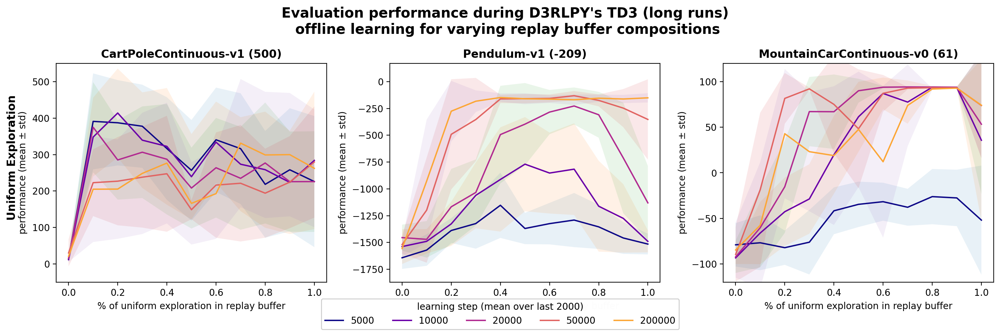

In [ ]:
PLOT_BEST = False
TRAIN_TIME = "long"
LIBRARY = "d3rlpy"
ALGORITHM = "td3"
experiment_logs = all_logs[TRAIN_TIME][LIBRARY][ALGORITHM]

plot_summary(
    experiment_logs,
    SMOOTH_MODE,
    SMOOTH_WINDOW,
    STEPS_TO_TAKE,
    LAST_STEPS,
    types_to_plot=("unif",),# "action", "branch"),
    plot_best=PLOT_BEST,
    title=f"Evaluation performance during {LIBRARY.upper()}'s {ALGORITHM.upper()} ({TRAIN_TIME} runs)\n offline learning for varying replay buffer compositions",
)
# save_figure(f"summary-chosen-{LIBRARY}-{ALGORITHM}-{TRAIN_TIME}", format="png")

plt.show()

===========================CHOSEN===========================


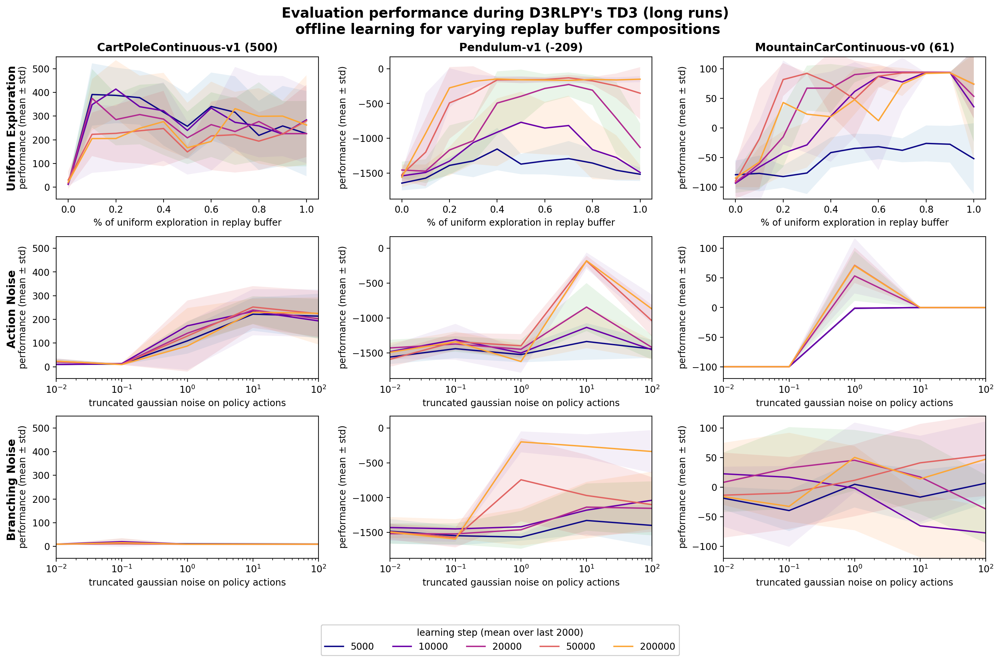

===========================CHOSEN===========================


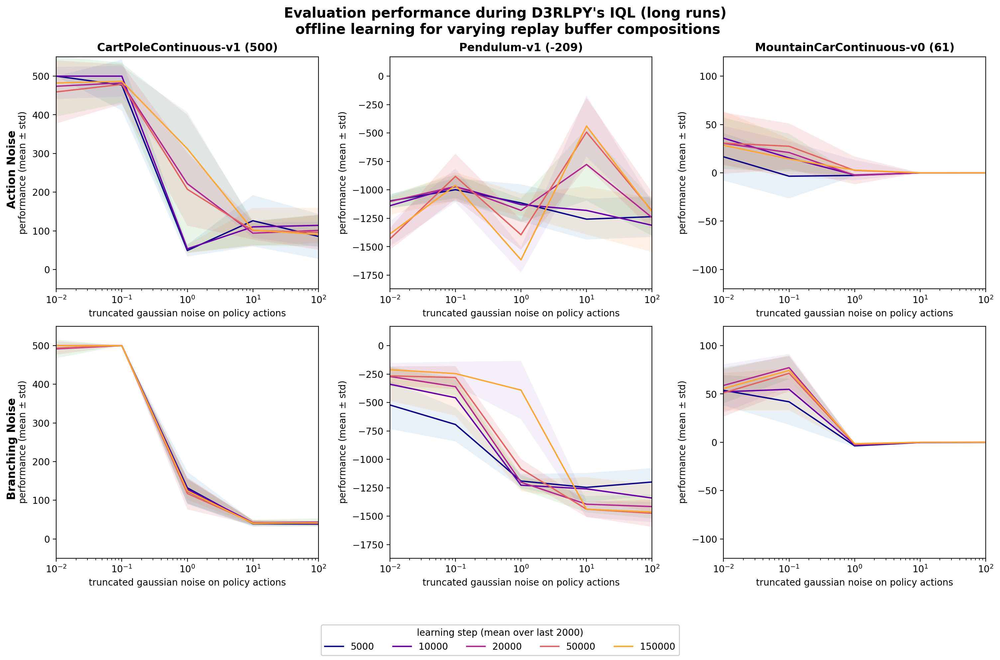

===========================CHOSEN===========================


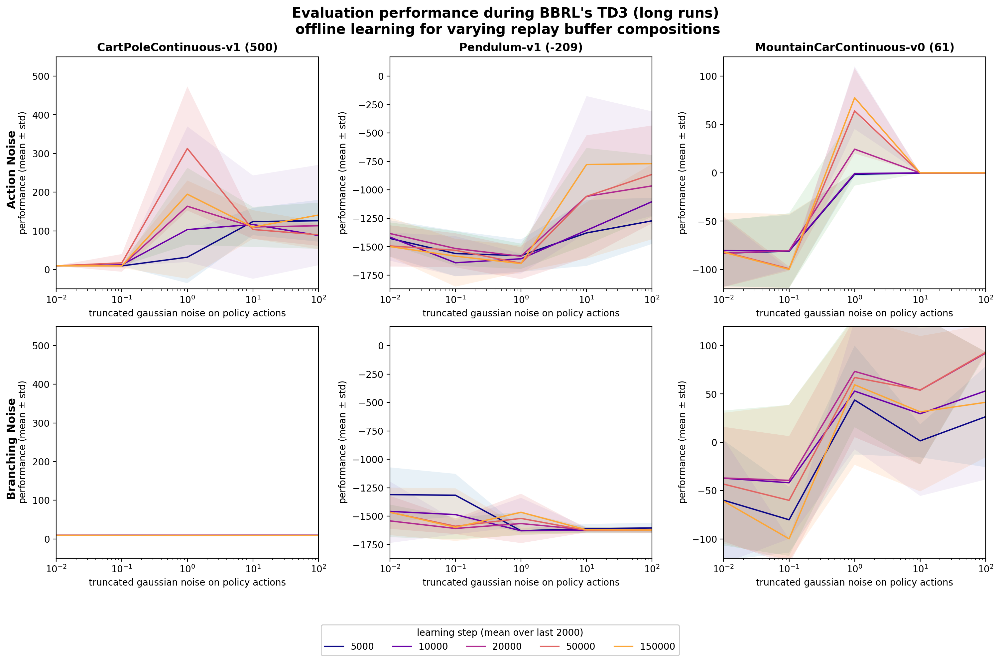

===========================CHOSEN===========================


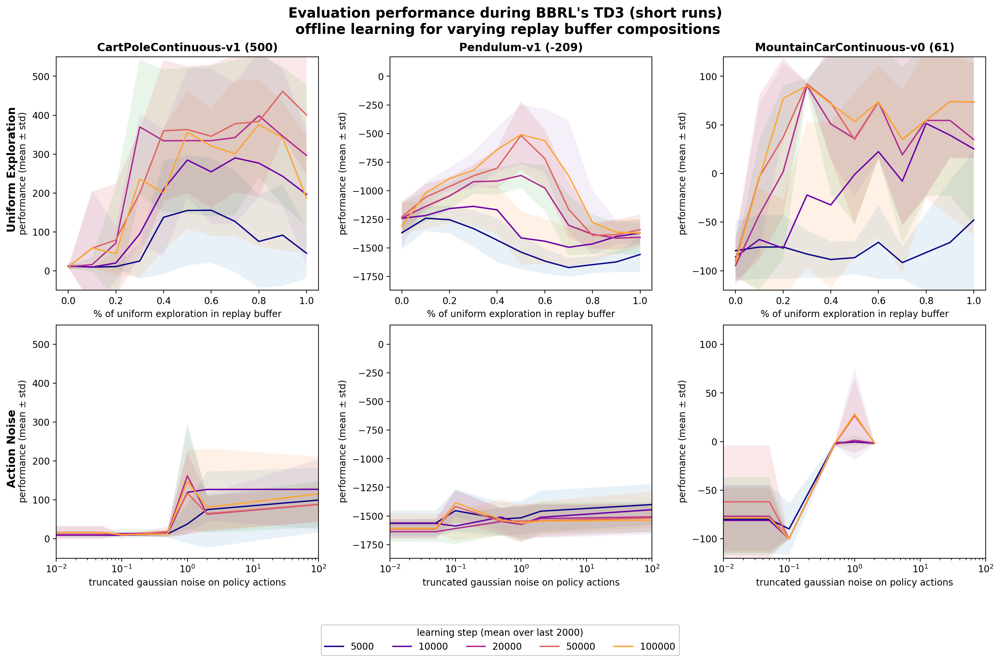

============================BEST============================


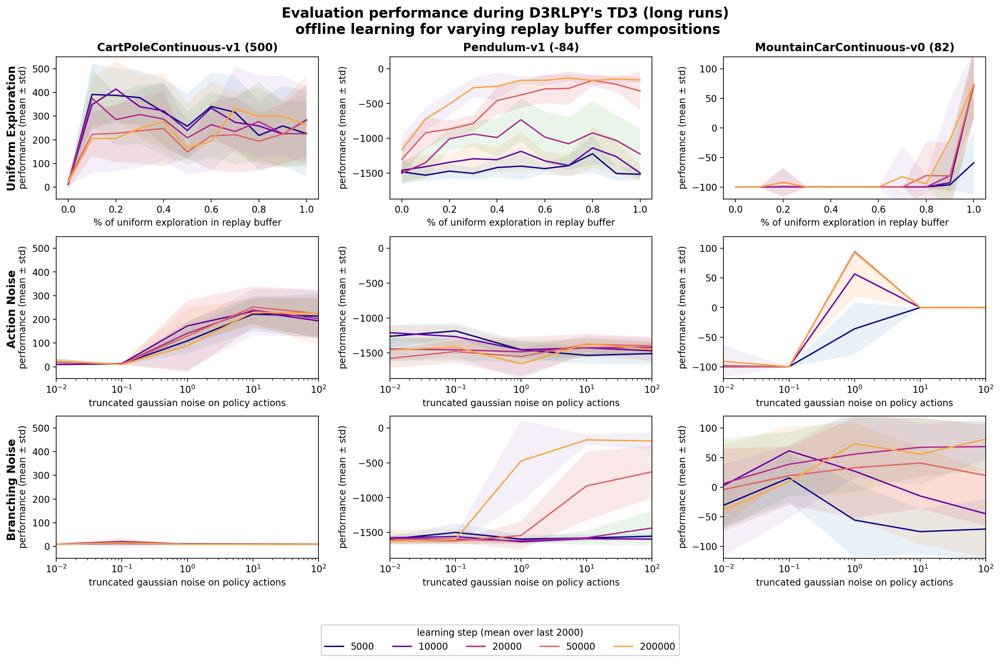

============================BEST============================


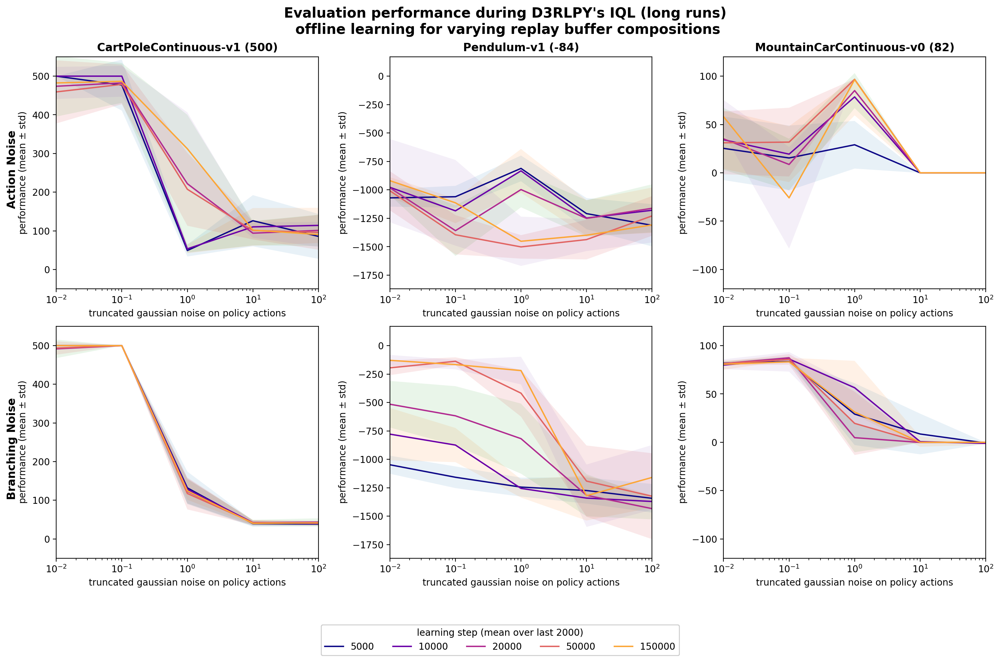

============================BEST============================


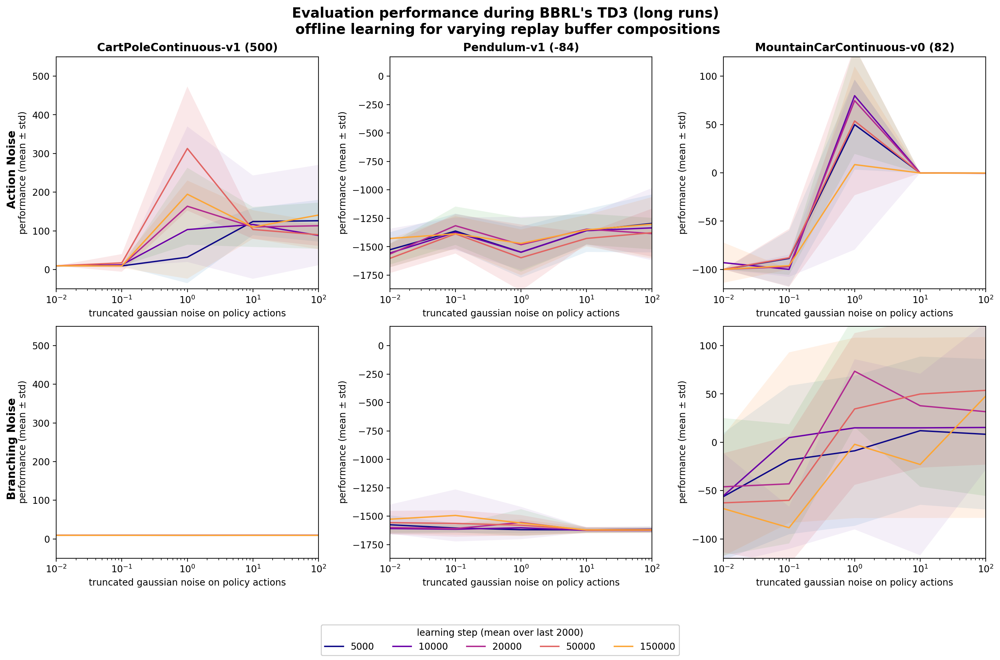

============================BEST============================


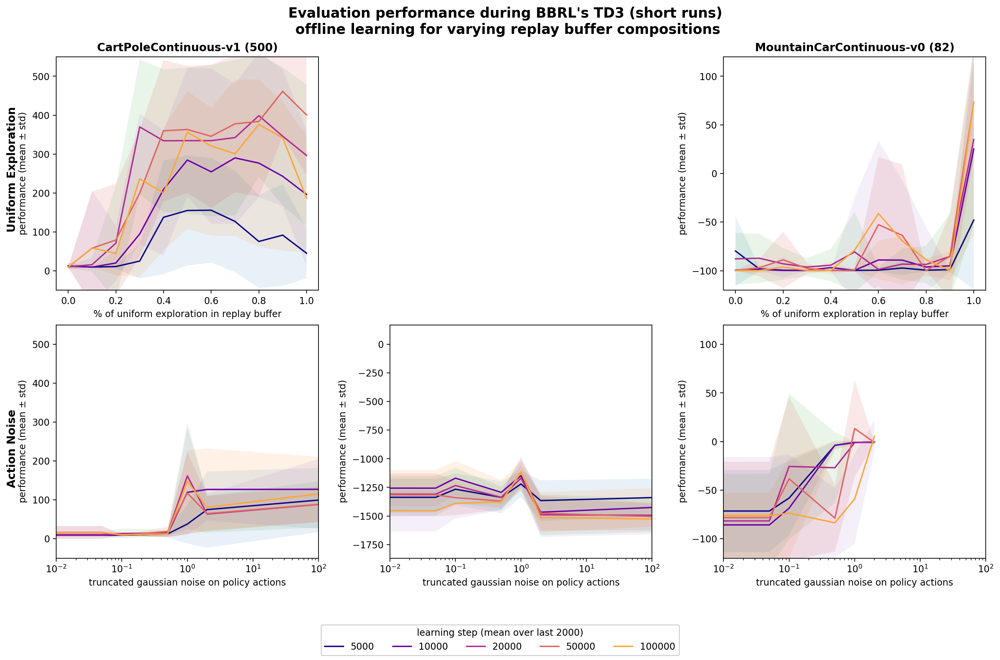

===========================CHOSEN===========================


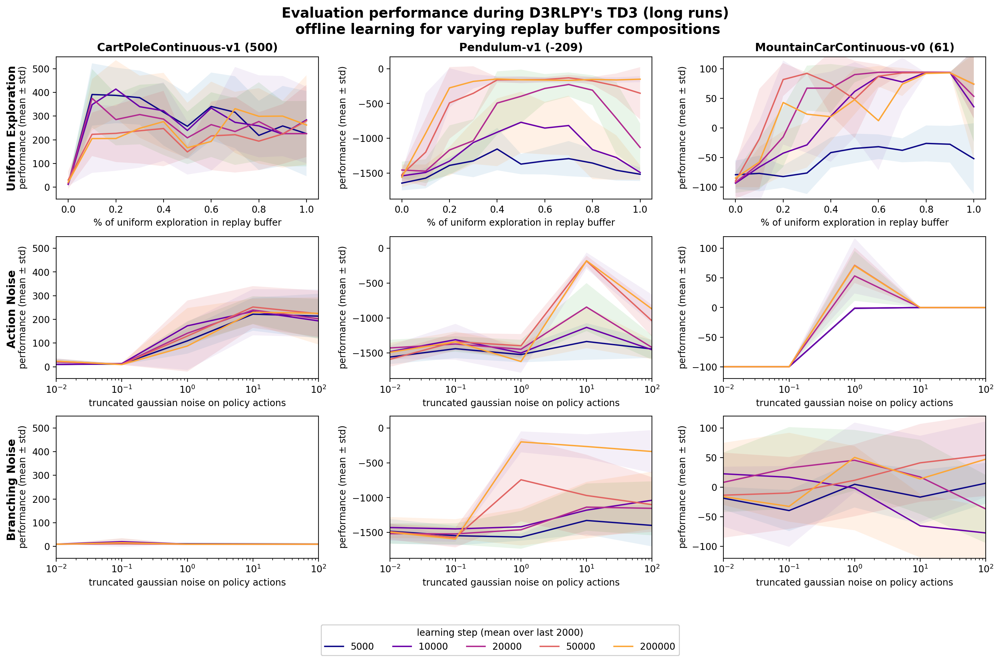

===========================CHOSEN===========================


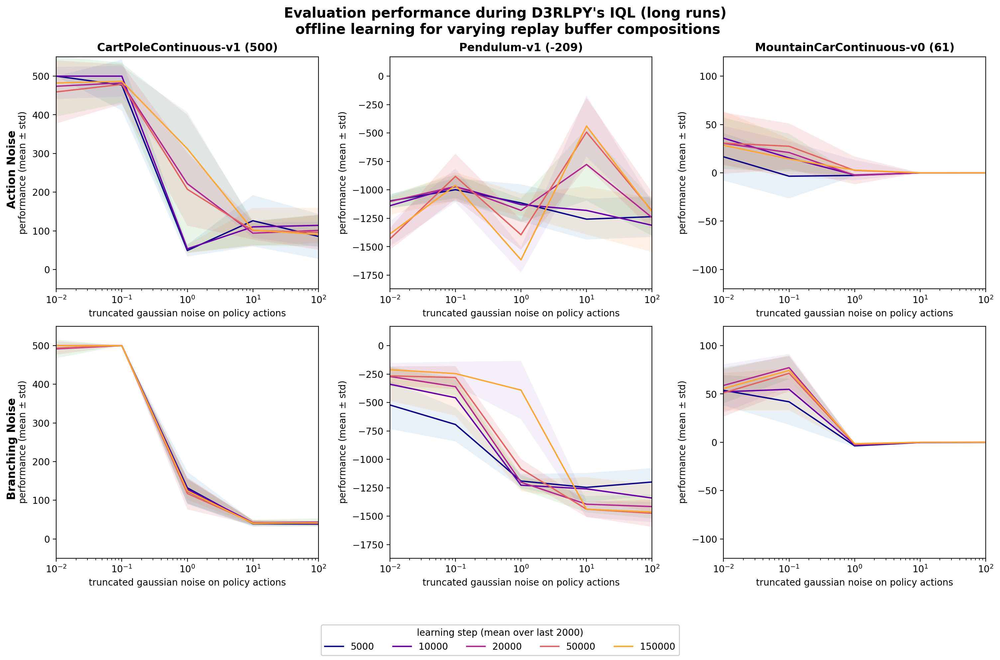

===========================CHOSEN===========================


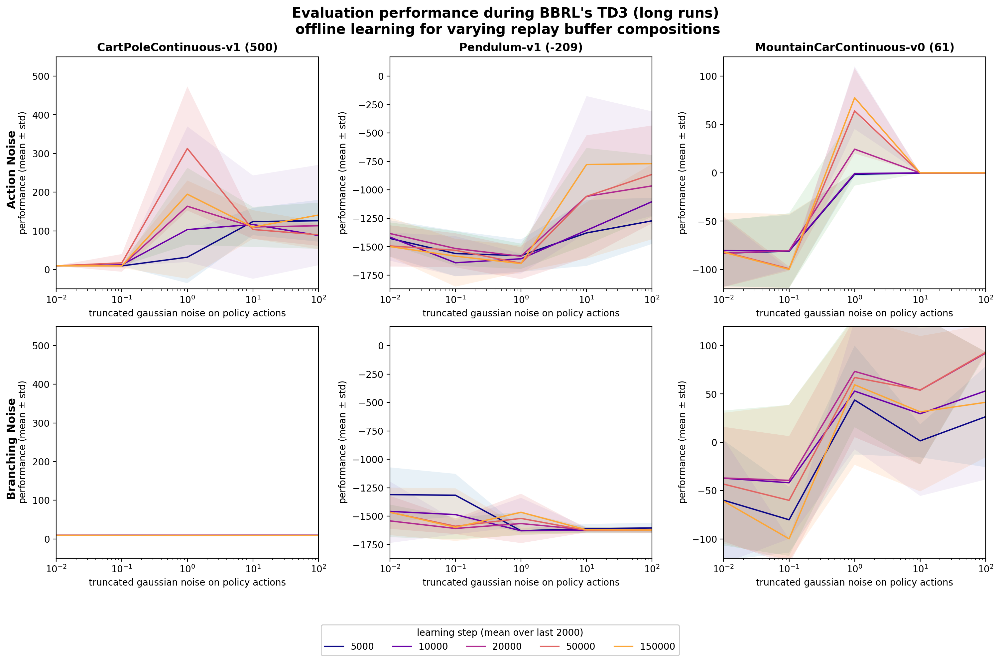

===========================CHOSEN===========================


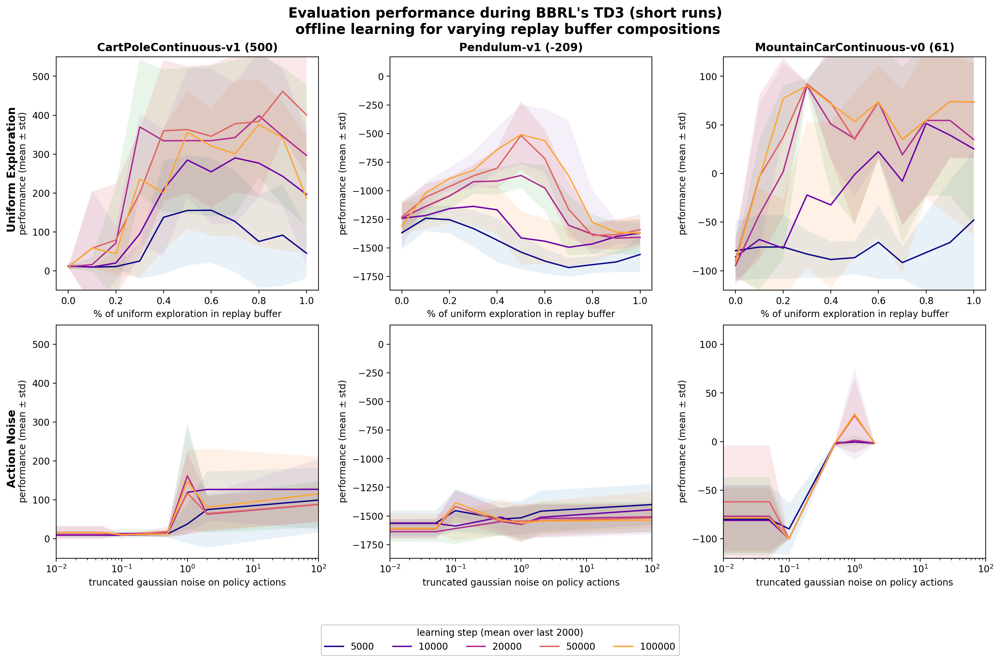

In [84]:
for PLOT_BEST in (False,True, False): 
    
    for TRAIN_TIME in ("long", "short"):
        for LIBRARY in ("d3rlpy", "bbrl"):
            for ALGORITHM in tuple(("td3", "iql")):
                if LIBRARY not in all_logs[TRAIN_TIME]:
                    continue
                if ALGORITHM not in all_logs[TRAIN_TIME][LIBRARY]:
                    continue
                
                experiment_logs = all_logs[TRAIN_TIME][LIBRARY][ALGORITHM]

                plot_summary(
                    experiment_logs,
                    SMOOTH_MODE,
                    SMOOTH_WINDOW,
                    STEPS_TO_TAKE,
                    LAST_STEPS,
                    types_to_plot=("unif", "action", "branch"),
                    plot_best=PLOT_BEST,
                    title=f"Evaluation performance during {LIBRARY.upper()}'s {ALGORITHM.upper()} ({TRAIN_TIME} runs)\n offline learning for varying replay buffer compositions",
                )
                if PLOT_BEST:
                    print("BEST".center(60,"="))
                #     save_figure(f"summary-best-{LIBRARY}-{ALGORITHM}-{TRAIN_TIME}")
                else:
                    print("CHOSEN".center(60,"="))
                #     save_figure(f"summary-chosen-{LIBRARY}-{ALGORITHM}-{TRAIN_TIME}")
                save_figure(f"summary-chosen-{LIBRARY}-{ALGORITHM}-{TRAIN_TIME}")
                plt.show()

## Closer inspection of experiments

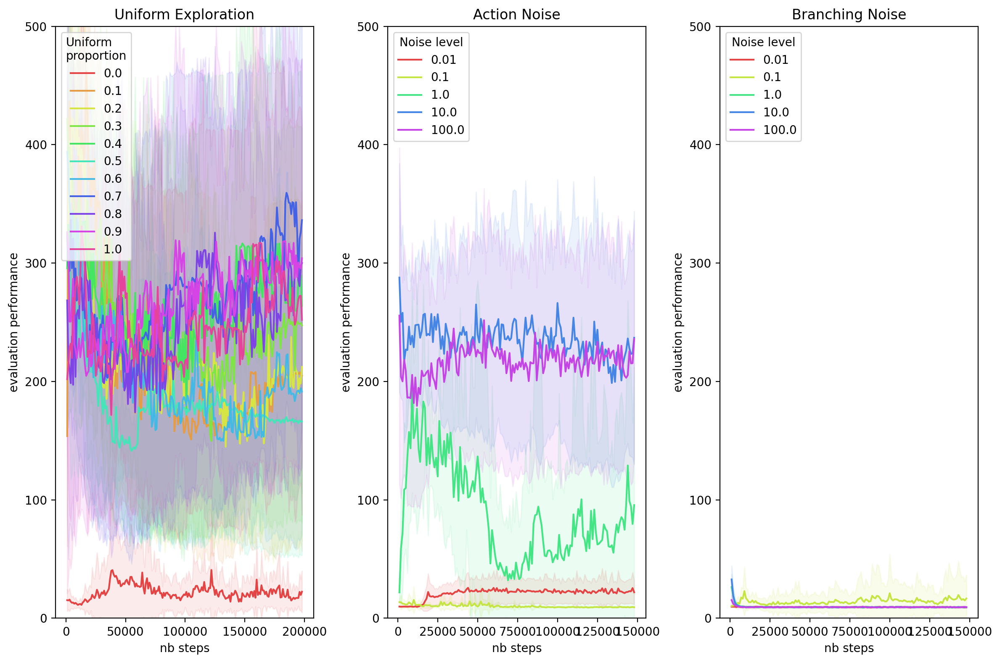

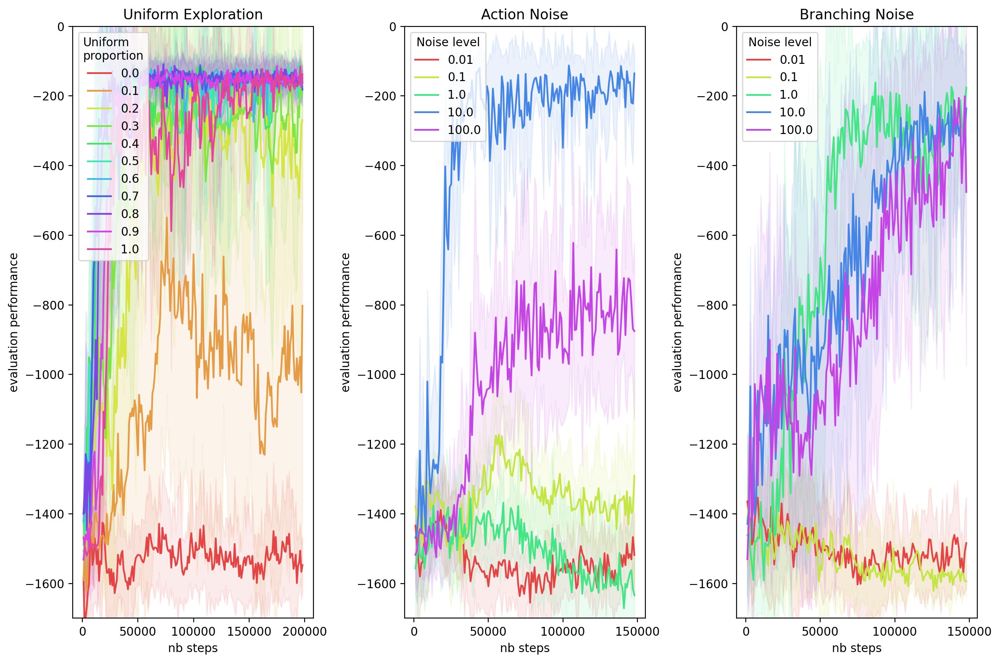

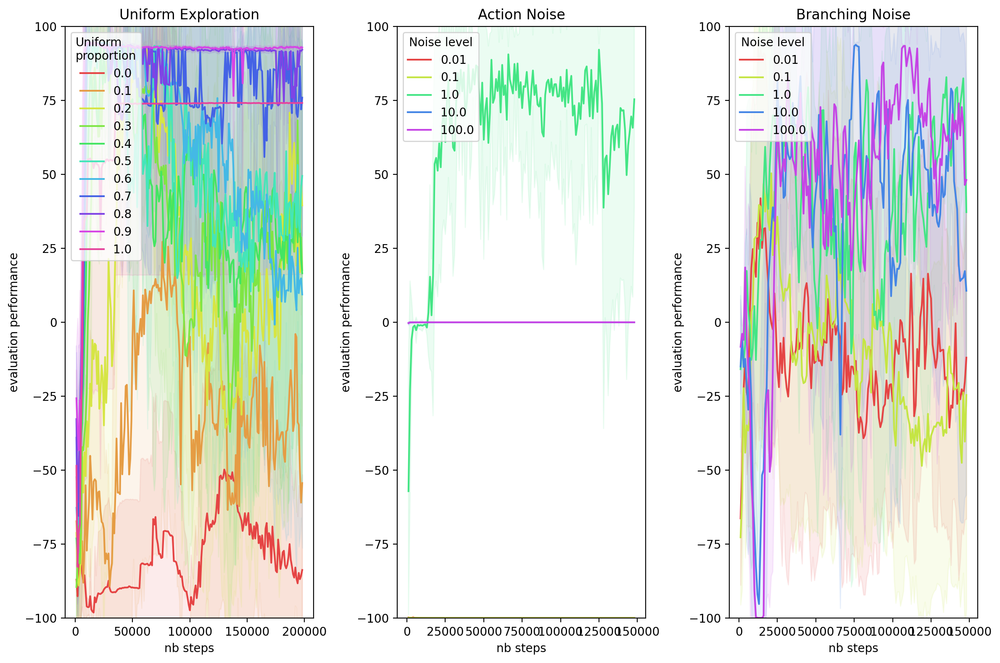

In [73]:
from pmind.config.environments import REWARDS_TO_PLOT, REWARD_LIMITS
for ALGORITHM in ("td3",):#("td3", "iql"):
    experiment_logs = all_logs["long"]["d3rlpy"][ALGORITHM]
    for i, env_name in enumerate(ENV_NAMES):
        
        types = ("action", "branch") if ALGORITHM == "iql" else ("unif", "action", "branch")
        fig, axes = plt.subplots(1, len(types), figsize=(12, 8))
        for j, rb_composition_type in enumerate(types):
            if not experiment_logs[rb_composition_type]:
                continue
            plot_learning_curves(
                experiment_logs[rb_composition_type][env_name][
                    REWARDS_TO_PLOT[rb_composition_type][env_name][0]
                ],
                SMOOTH_MODE,
                SMOOTH_WINDOW,
                PLOT_ALL_CURVES,
                PLOT_STD,
                PLOT_MARGIN,
                ax=axes[j],
            )
            axes[j].set_ylim(REWARD_LIMITS[env_name])
            axes[j].legend(
                title="Uniform\nproportion"
                if rb_composition_type == "unif"
                else "Noise level",
                loc="upper left",
            )
            axes[j].set_title(
                "Uniform Exploration"
                if rb_composition_type == "unif"
                else "Action Noise"
                if rb_composition_type == "action"
                else "Branching Noise"
            )
        plt.tight_layout()
        save_figure(f"learning-curves-{ALGORITHM}-{env_name}", format="png")

In [ ]:
experiment_logs = all_logs["long"]["d3rlpy"]["td3"]
PLOT_COMPOSITIONS_BY_STEP = False
PLOT_COMPOSITIONS_BY_REWARD = False


for rb_composition_type in ("unif", "action", "branch"):
    print("===========", rb_composition_type.upper(), "=============")
    for env_name in ENV_NAMES:
        if not experiment_logs[rb_composition_type]:
            continue

        env_performances = experiment_logs[rb_composition_type][env_name]

        # ============= Learning Curves =============
        plot_learning_curves_by_reward(
            env_performances,
            rb_composition_type,
            SMOOTH_MODE,
            SMOOTH_WINDOW,
            PLOT_ALL_CURVES,
            PLOT_STD,
            PLOT_MARGIN,
        )
        plt.show()

        # ============= Compositions By Step =============
        if PLOT_COMPOSITIONS_BY_STEP:
            plot_compositions_by_step(
                env_performances,
                STEPS_TO_TAKE,
                SMOOTH_MODE,
                SMOOTH_WINDOW,
                LAST_STEPS,
            )
            plt.show()

        # ============= Compositions By Exploit Reward =============
        
        if PLOT_COMPOSITIONS_BY_REWARD:
            plot_compositions_by_reward(
                env_performances,
                STEPS_TO_TAKE,
                SMOOTH_MODE,
                SMOOTH_WINDOW,
                LAST_STEPS,
            )
            plt.show()